In [ ]:
import kagglehub
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
import shutil
import yaml
from tqdm.auto import tqdm
import cv2
from matplotlib.patches import Rectangle
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import glob
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

# Загрузка датасета

In [ ]:
DATASET_PATH = kagglehub.dataset_download("biancaferreira/african-wildlife")
class_counts = {}
img_sizes = []

for class_name in ['buffalo', 'elephant', 'rhino', 'zebra']:
    class_dir = os.path.join(DATASET_PATH, class_name)
    images = [f for f in os.listdir(class_dir) if f.endswith('.jpg')]
    class_counts[class_name] = len(images)

    for img_file in random.sample(images, min(5, len(images))):
        img_path = os.path.join(class_dir, img_file)
        with Image.open(img_path) as img:
            img_sizes.append(img.size)

In [ ]:
def create_yolo_directories(output_path):
    os.makedirs(os.path.join(output_path, 'images', 'train'), exist_ok=True)
    os.makedirs(os.path.join(output_path, 'images', 'val'), exist_ok=True)
    os.makedirs(os.path.join(output_path, 'labels', 'train'), exist_ok=True)
    os.makedirs(os.path.join(output_path, 'labels', 'val'), exist_ok=True)

    return output_path

OUTPUT_PATH = "african_wildlife_yolo"
create_yolo_directories(OUTPUT_PATH)

'african_wildlife_yolo'

Распределение данных на обучающую и валидационную выборки

In [ ]:
def split_dataset(dataset_path, output_path, val_ratio=0.2, sample_limit=None):
    classes = ['buffalo', 'elephant', 'rhino', 'zebra']
    class_indices = {class_name: idx for idx, class_name in enumerate(classes)}

    # Создаем файл data.yaml
    with open(os.path.join(output_path, 'data.yaml'), 'w') as f:
        yaml_content = {
            'path': os.path.abspath(output_path),
            'train': 'images/train',
            'val': 'images/val',
            'nc': len(classes),
            'names': classes
        }
        yaml.dump(yaml_content, f, default_flow_style=False)

    for class_name in classes:
        class_dir = os.path.join(dataset_path, class_name)
        class_id = class_indices[class_name]

        all_images = [f for f in os.listdir(class_dir) if f.endswith('.jpg')]

        if sample_limit and len(all_images) > sample_limit:
            selected_images = random.sample(all_images, sample_limit)
        else:
            selected_images = all_images

        random.shuffle(selected_images)

        split_idx = int(len(selected_images) * (1 - val_ratio))
        train_images = selected_images[:split_idx]
        val_images = selected_images[split_idx:]

        print(f"Класс {class_name}: {len(train_images)} для обучения, {len(val_images)} для валидации")

        for img_set, target_subdir in [(train_images, 'train'), (val_images, 'val')]:
            for img_file in tqdm(img_set, desc=f"Копирование {class_name} в {target_subdir}"):
                img_src = os.path.join(class_dir, img_file)
                img_dst = os.path.join(output_path, 'images', target_subdir, img_file)
                shutil.copy(img_src, img_dst)

                txt_file = img_file.replace('.jpg', '.txt')
                txt_src = os.path.join(class_dir, txt_file)
                txt_dst = os.path.join(output_path, 'labels', target_subdir, txt_file)

                with open(txt_src, 'r') as f:
                    content = f.read().strip().split('\n')

                with open(txt_dst, 'w') as f:
                    for line in content:
                        parts = line.strip().split()
                        if len(parts) == 5:
                            parts[0] = str(class_id)
                            f.write(' '.join(parts) + '\n')
                        else:
                            pass
split_dataset(DATASET_PATH, OUTPUT_PATH, val_ratio=0.2, sample_limit=200)


Класс buffalo: 160 для обучения, 40 для валидации


Копирование buffalo в val: 100%|██████████| 40/40 [00:05<00:00,  7.68it/s]


Класс elephant: 160 для обучения, 40 для валидации


Копирование elephant в val: 100%|██████████| 40/40 [00:02<00:00, 18.16it/s]


Класс rhino: 160 для обучения, 40 для валидации


Копирование rhino в val: 100%|██████████| 40/40 [00:03<00:00, 12.10it/s]


Класс zebra: 160 для обучения, 40 для валидации


Копирование zebra в val: 100%|██████████| 40/40 [00:04<00:00,  9.19it/s]


Данные из датасета

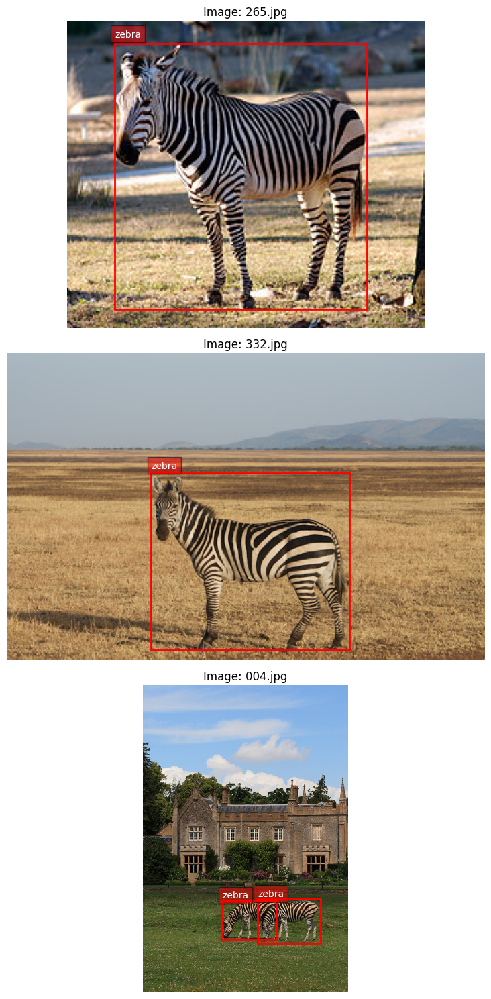

In [ ]:
def visualize_dataset_samples(output_path, num_samples=5):
    with open(os.path.join(output_path, 'data.yaml'), 'r') as f:
        data_config = yaml.safe_load(f)
        class_names = data_config['names']

    images_dir = os.path.join(output_path, 'images', 'train')
    labels_dir = os.path.join(output_path, 'labels', 'train')

    all_images = os.listdir(images_dir)
    random.seed(42)
    sample_images = random.sample(all_images, min(num_samples, len(all_images)))

    plt.figure(figsize=(15, 5 * num_samples))

    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(images_dir, img_file)
        label_path = os.path.join(labels_dir, img_file.replace('.jpg', '.txt'))

        # Загружаем изображение
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        height, width, _ = img.shape

        # Создаем подграфик
        plt.subplot(num_samples, 1, i+1)
        plt.imshow(img)

        # Загружаем и отображаем разметку
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.read().strip().split('\n')

                for line in lines:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        class_id, x_center, y_center, w, h = map(float, parts)

                        # Преобразуем нормализованные координаты в пиксели
                        x_center *= width
                        y_center *= height
                        w *= width
                        h *= height

                        # Вычисляем координаты верхнего левого угла
                        x1 = x_center - w/2
                        y1 = y_center - h/2

                        # Добавляем прямоугольник на изображение
                        rect = Rectangle((x1, y1), w, h,
                                        linewidth=2, edgecolor='r', facecolor='none')
                        plt.gca().add_patch(rect)

                        # Добавляем подпись с классом
                        class_name = class_names[int(class_id)]
                        plt.text(x1, y1-5, class_name,
                                color='white', fontsize=10,
                                bbox=dict(facecolor='red', alpha=0.5))

        plt.title(f"Image: {img_file}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_dataset_samples(OUTPUT_PATH, num_samples=3)


#YOLO

In [ ]:
model = YOLO("yolo11n.pt")
results = model.train(
    data=os.path.join(OUTPUT_PATH, "data.yaml"),
    epochs=10,
    imgsz=640,
    batch=16,
    patience=10,
    device=0,  # GPU
    project='african_wildlife_detection',
    name=f'yolov11_training',
    save=True,
    plots=True
)


Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=african_wildlife_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov11_training12, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose=12.0

train: Scanning /home/jupyter/datasphere/african_wildlife_yolo/labels/train.cache... 339 images, 0 backgrounds, 0 corrupt: 100%|██████████| 339/339 [00:00<?, ?it/s]

train: /home/jupyter/datasphere/african_wildlife_yolo/images/train/054.jpg: corrupt JPEG restored and saved
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'


val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 131.2±39.4 MB/s, size: 115.5 KB)


val: Scanning /home/jupyter/datasphere/african_wildlife_yolo/labels/val.cache... 130 images, 0 backgrounds, 0 corrupt: 100%|██████████| 130/130 [00:00<?, ?it/s]

val: /home/jupyter/datasphere/african_wildlife_yolo/images/val/033.jpg: corrupt JPEG restored and saved


Plotting labels to african_wildlife_detection/yolov11_training12/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to african_wildlife_detection/yolov11_training12
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.42G      2.521      3.924      2.575          6        640: 100%|██████████| 22/22 [00:05<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.18it/s]

                   all        130        245    0.00435      0.656     0.0551     0.0229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.58G      1.628       3.04      1.922          7        640: 100%|██████████| 22/22 [00:03<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.47it/s]

                   all        130        245      0.654      0.122      0.298      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.58G      1.284      2.548      1.679          4        640: 100%|██████████| 22/22 [00:03<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.33it/s]

                   all        130        245      0.501      0.475      0.426      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.58G      1.174      2.274      1.534          3        640: 100%|██████████| 22/22 [00:03<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.05it/s]

                   all        130        245      0.493      0.606      0.551      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.58G      1.078      2.108       1.44          4        640: 100%|██████████| 22/22 [00:03<00:00,  6.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.56it/s]


                   all        130        245      0.522      0.599      0.571      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.58G     0.9821      1.934      1.387          6        640: 100%|██████████| 22/22 [00:03<00:00,  6.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.52it/s]

                   all        130        245      0.633      0.628      0.663      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.58G     0.9252       1.76      1.305          5        640: 100%|██████████| 22/22 [00:03<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.54it/s]

                   all        130        245      0.682      0.679      0.738      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.58G     0.9531      1.793      1.308          4        640: 100%|██████████| 22/22 [00:03<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.67it/s]

                   all        130        245      0.724      0.643      0.754       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.58G     0.8619      1.641      1.253          4        640: 100%|██████████| 22/22 [00:03<00:00,  6.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.70it/s]

                   all        130        245      0.779      0.635      0.783      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.58G     0.8531      1.591      1.236          6        640: 100%|██████████| 22/22 [00:03<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.85it/s]

                   all        130        245      0.769      0.694       0.81      0.635



10 epochs completed in 0.028 hours.
Optimizer stripped from african_wildlife_detection/yolov11_training12/weights/last.pt, 5.4MB
Optimizer stripped from african_wildlife_detection/yolov11_training12/weights/best.pt, 5.4MB

Validating african_wildlife_detection/yolov11_training12/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.51it/s]


                   all        130        245      0.769      0.694       0.81      0.634
               buffalo         27         37      0.775       0.56      0.767      0.637
              elephant         28         59      0.736      0.627      0.725       0.55
                 rhino         35         54      0.701      0.778      0.854      0.692
                 zebra         40         95      0.864      0.811      0.896      0.658
Speed: 1.2ms preprocess, 2.4ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to african_wildlife_detection/yolov11_training12


Валидация

In [ ]:
val_results = model.val()
print(f"Validation Results:")
print(f"mAP@0.5: {val_results.box.map50:.4f}")
print(f"mAP@0.5:0.95: {val_results.box.map:.4f}")

# Вывод средних значений precision и recall
print(f"Average Precision: {np.mean(val_results.box.p):.4f}")
print(f"Average Recall: {np.mean(val_results.box.r):.4f}")

# Вывод precision и recall для каждого класса
print("\nPrecision по классам:")
for i, p in enumerate(val_results.box.p):
    class_name = val_results.names[i] if i in val_results.names else f"Класс {i}"
    print(f"  {class_name}: {p:.4f}")

print("\nRecall по классам:")
for i, r in enumerate(val_results.box.r):
    class_name = val_results.names[i] if i in val_results.names else f"Класс {i}"
    print(f"  {class_name}: {r:.4f}")


Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1742.8±902.7 MB/s, size: 131.5 KB)


val: Scanning /home/jupyter/datasphere/african_wildlife_yolo/labels/val.cache... 130 images, 0 backgrounds, 0 corrupt: 100%|██████████| 130/130 [00:00<?, ?it/s]

val: /home/jupyter/datasphere/african_wildlife_yolo/images/val/033.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.32it/s]


                   all        130        245      0.776       0.68      0.806      0.631
               buffalo         27         37      0.775      0.541       0.76      0.632
              elephant         28         59      0.738      0.619       0.72      0.544
                 rhino         35         54      0.722      0.759      0.849      0.688
                 zebra         40         95      0.871        0.8      0.897      0.658
Speed: 1.3ms preprocess, 3.9ms inference, 0.0ms loss, 12.1ms postprocess per image
Results saved to african_wildlife_detection/yolov11_training122
Validation Results:
mAP@0.5: 0.8063
mAP@0.5:0.95: 0.6307
Average Precision: 0.7763
Average Recall: 0.6798

Precision по классам:
  buffalo: 0.7748
  elephant: 0.7375
  rhino: 0.7217
  zebra: 0.8711

Recall по классам:
  buffalo: 0.5405
  elephant: 0.6192
  rhino: 0.7593
  zebra: 0.8000


In [ ]:
def visualize_predictions(model_path=None, num_images=5, conf_threshold=0.25):

    prediction_model = YOLO(model_path)
    test_folder = os.path.join(OUTPUT_PATH, "images", "val")
    image_files = [f for f in os.listdir(test_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

    selected_images = random.sample(image_files, min(num_images, len(image_files)))

    fig, axes = plt.subplots(len(selected_images), 1, figsize=(12, 7 * len(selected_images)))
    if len(selected_images) == 1:
        axes = [axes]

    for i, img_file in enumerate(selected_images):
        img_path = os.path.join(test_folder, img_file)

        results = prediction_model.predict(img_path, conf=conf_threshold, save=False)[0]
        result_img = results.plot()
        axes[i].imshow(result_img)
        axes[i].set_title(f"Предсказания для {img_file}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

    return prediction_model



image 1/1 /home/jupyter/datasphere/african_wildlife_yolo/images/val/028.jpg: 416x640 1 buffalo, 1 rhino, 8.6ms
Speed: 1.7ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /home/jupyter/datasphere/african_wildlife_yolo/images/val/123.jpg: 352x640 1 rhino, 73.1ms
Speed: 1.8ms preprocess, 73.1ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 640)

image 1/1 /home/jupyter/datasphere/african_wildlife_yolo/images/val/201.jpg: 320x640 1 rhino, 67.2ms
Speed: 1.5ms preprocess, 67.2ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 640)


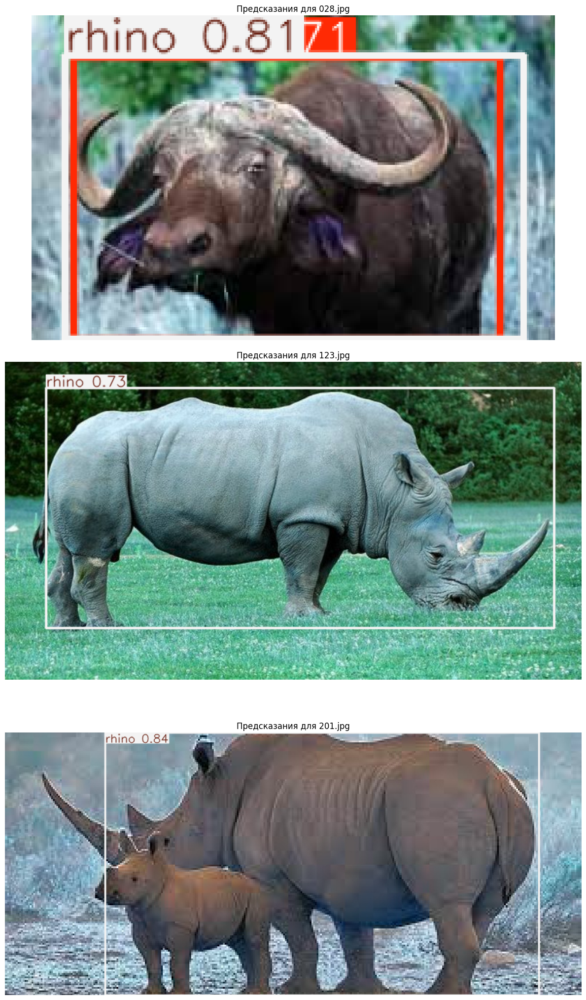

In [ ]:
best_model_path = 'african_wildlife_detection/yolov11_training12/weights/best.pt'

prediction_model = visualize_predictions(
    model_path=best_model_path,
    num_images=3,
    conf_threshold=0.3
)

## Улучшенный бейзлайн YOLO

Увеличим количество эпох

In [ ]:
def train_with_optimized_hyperparameters(epochs=20):

    # Загружаем базовую модель
    model = YOLO(f"yolo11n.pt")

    # Оптимизированные гиперпараметры
    hyperparameters = {
        'lr0': 0.01,           # Начальная скорость обучения
        'lrf': 0.01,           # Конечная скорость обучения (как доля от lr0)
        'momentum': 0.937,     # SGD momentum/Adam beta1
        'weight_decay': 0.0005, # Регуляризация весов
        'warmup_epochs': 3.0,  # Длительность warmup в эпохах
        'warmup_momentum': 0.8, # Начальный момент при warmup
        'box': 7.5,            # Вес потери box-регрессии
        'cls': 0.5,            # Вес потери классификации
        'dfl': 1.5,            # Вес потери распределения
        'nbs': 64              # Номинальный размер батча
    }

    results = model.train(
        data=os.path.join(OUTPUT_PATH, "data.yaml"),
        epochs=epochs,
        imgsz=640,
        batch=16,
        patience=15,
        device=0,
        project='african_wildlife_detection',
        name=f'yolo11n_optimized',
        save=True,
        plots=True,
        **hyperparameters
    )

    return model, results


In [ ]:
optimized_model, opt_results = train_with_optimized_hyperparameters(
    epochs=20
)

Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=african_wildlife_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo11n_optimized, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=15, perspective=0.0, plots=True, pose=12.0,

train: Scanning /home/jupyter/datasphere/african_wildlife_yolo/labels/train.cache... 339 images, 0 backgrounds, 0 corrupt: 100%|██████████| 339/339 [00:00<?, ?it/s]

train: /home/jupyter/datasphere/african_wildlife_yolo/images/train/054.jpg: corrupt JPEG restored and saved
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'


val: Fast image access ✅ (ping: 0.3±0.0 ms, read: 148.5±49.8 MB/s, size: 115.5 KB)


val: Scanning /home/jupyter/datasphere/african_wildlife_yolo/labels/val.cache... 130 images, 0 backgrounds, 0 corrupt: 100%|██████████| 130/130 [00:00<?, ?it/s]

val: /home/jupyter/datasphere/african_wildlife_yolo/images/val/033.jpg: corrupt JPEG restored and saved


Plotting labels to african_wildlife_detection/yolo11n_optimized/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to african_wildlife_detection/yolo11n_optimized
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.46G      0.801      2.966      1.222         13        640: 100%|██████████| 22/22 [00:05<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.62it/s]

                   all        130        245     0.0182      0.957      0.377        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.62G     0.9528      2.353      1.334          7        640: 100%|██████████| 22/22 [00:03<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.96it/s]

                   all        130        245     0.0124      0.945      0.494      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.63G     0.9539      1.863      1.305         10        640: 100%|██████████| 22/22 [00:03<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.87it/s]


                   all        130        245      0.119      0.924      0.545      0.413

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.63G     0.9134       1.61      1.266          9        640: 100%|██████████| 22/22 [00:03<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.92it/s]


                   all        130        245       0.82      0.426      0.599      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.63G     0.9449      1.574      1.297          8        640: 100%|██████████| 22/22 [00:03<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.21it/s]

                   all        130        245      0.631      0.536      0.673      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.63G     0.9704      1.516       1.29         10        640: 100%|██████████| 22/22 [00:03<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.30it/s]

                   all        130        245      0.633      0.668       0.74      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.63G     0.9483      1.427      1.285          7        640: 100%|██████████| 22/22 [00:03<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.86it/s]

                   all        130        245      0.713      0.636      0.716      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.63G     0.8957      1.297      1.248          8        640: 100%|██████████| 22/22 [00:03<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.76it/s]

                   all        130        245      0.722       0.58      0.652      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.63G     0.8494      1.242      1.217         13        640: 100%|██████████| 22/22 [00:03<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.26it/s]

                   all        130        245      0.629      0.614      0.669      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.63G     0.8386      1.165       1.22         11        640: 100%|██████████| 22/22 [00:03<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.33it/s]

                   all        130        245      0.796       0.76      0.846      0.639


Closing dataloader mosaic
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.63G     0.7275      1.462      1.157          4        640: 100%|██████████| 22/22 [00:05<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.52it/s]

                   all        130        245      0.834      0.734      0.827      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.63G     0.7197      1.286      1.149          3        640: 100%|██████████| 22/22 [00:03<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.39it/s]

                   all        130        245      0.764        0.7      0.748       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.63G     0.6955      1.237      1.113          4        640: 100%|██████████| 22/22 [00:03<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.62it/s]

                   all        130        245      0.884      0.818      0.875      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.63G     0.6626      1.212      1.082          4        640: 100%|██████████| 22/22 [00:03<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.28it/s]


                   all        130        245      0.783      0.758      0.841      0.634

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.63G     0.6471      1.113      1.066          5        640: 100%|██████████| 22/22 [00:03<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.55it/s]

                   all        130        245      0.827      0.798      0.871      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      2.63G      0.613      1.074       1.07          3        640: 100%|██████████| 22/22 [00:03<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.58it/s]

                   all        130        245      0.844      0.857      0.897      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.63G     0.6098      1.009      1.048          4        640: 100%|██████████| 22/22 [00:03<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.47it/s]

                   all        130        245      0.923      0.834      0.915      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.63G     0.6115     0.9515      1.034          8        640: 100%|██████████| 22/22 [00:03<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.66it/s]

                   all        130        245      0.901      0.814      0.915      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.63G     0.5654      0.923     0.9979          7        640: 100%|██████████| 22/22 [00:03<00:00,  6.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.61it/s]


                   all        130        245        0.9      0.822       0.91      0.733

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.63G     0.5344     0.8888      1.001          5        640: 100%|██████████| 22/22 [00:03<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.99it/s]

                   all        130        245      0.885      0.858      0.922       0.75



20 epochs completed in 0.046 hours.
Optimizer stripped from african_wildlife_detection/yolo11n_optimized/weights/last.pt, 5.4MB
Optimizer stripped from african_wildlife_detection/yolo11n_optimized/weights/best.pt, 5.4MB

Validating african_wildlife_detection/yolo11n_optimized/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.54it/s]


                   all        130        245      0.893      0.857      0.923      0.751
               buffalo         27         37      0.771      0.865      0.905      0.742
              elephant         28         59      0.884      0.763       0.88      0.707
                 rhino         35         54      0.963      0.955      0.974      0.848
                 zebra         40         95      0.953      0.845      0.932      0.706
Speed: 1.1ms preprocess, 2.3ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to african_wildlife_detection/yolo11n_optimized



image 1/1 /home/jupyter/datasphere/african_wildlife_yolo/images/val/049.jpg: 480x640 1 rhino, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /home/jupyter/datasphere/african_wildlife_yolo/images/val/231.jpg: 384x640 1 elephant, 11.3ms
Speed: 1.5ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /home/jupyter/datasphere/african_wildlife_yolo/images/val/242.jpg: 448x640 1 zebra, 11.3ms
Speed: 3.7ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


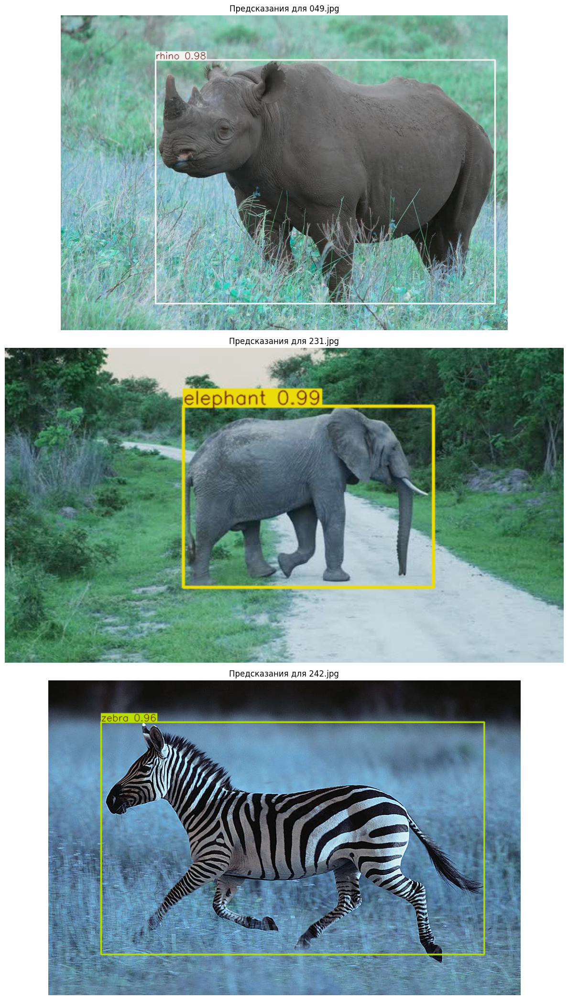

In [ ]:
best_model_path_optimized = 'african_wildlife_detection/yolo11n_optimized/weights/best.pt'

prediction_model = visualize_predictions(
    model_path=best_model_path_optimized,
    num_images=3,
    conf_threshold=0.3
)

Валидация базовой модели...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 112.8±31.1 MB/s, size: 133.4 KB)


val: Scanning /home/jupyter/datasphere/african_wildlife_yolo/labels/val.cache... 130 images, 0 backgrounds, 0 corrupt: 100%|██████████| 130/130 [00:00<?, ?it/s]

val: /home/jupyter/datasphere/african_wildlife_yolo/images/val/033.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.35it/s]


                   all        130        245      0.776       0.68      0.806      0.631
               buffalo         27         37      0.775      0.541       0.76      0.632
              elephant         28         59      0.738      0.619       0.72      0.544
                 rhino         35         54      0.722      0.759      0.849      0.688
                 zebra         40         95      0.871        0.8      0.897      0.658
Speed: 1.2ms preprocess, 4.6ms inference, 0.0ms loss, 16.4ms postprocess per image
Results saved to runs/detect/val6
Валидация улучшенной модели...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1438.8±1116.9 MB/s, size: 122.3 KB)


val: Scanning /home/jupyter/datasphere/african_wildlife_yolo/labels/val.cache... 130 images, 0 backgrounds, 0 corrupt: 100%|██████████| 130/130 [00:00<?, ?it/s]

val: /home/jupyter/datasphere/african_wildlife_yolo/images/val/033.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.32it/s]


                   all        130        245      0.861      0.883      0.924      0.752
               buffalo         27         37      0.746      0.865      0.904       0.74
              elephant         28         59      0.842      0.816       0.88       0.71
                 rhino         35         54      0.941      0.963      0.974      0.846
                 zebra         40         95      0.914       0.89      0.937      0.711
Speed: 1.4ms preprocess, 3.5ms inference, 0.0ms loss, 14.7ms postprocess per image
Results saved to runs/detect/val7

Сравнение метрик:
  Метрика  Базовая модель  Улучшенная модель  Изменение (%)
    mAP50          0.8063             0.9237        14.5492
 mAP50-95          0.6307             0.7520        19.2340
Precision          0.7763             0.8606        10.8616
   Recall          0.6798             0.8833        29.9451


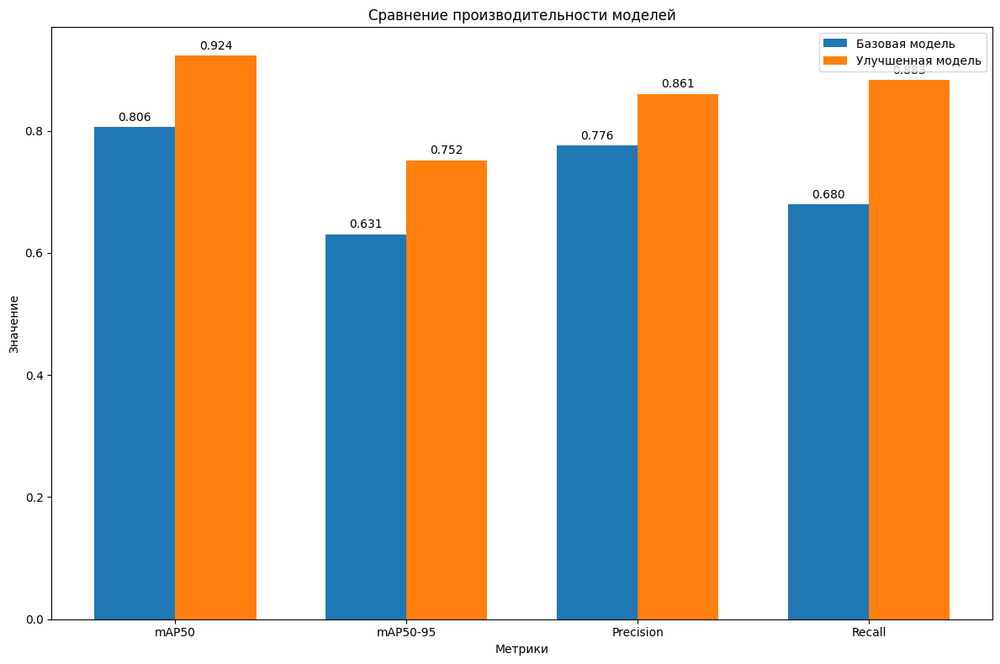

In [ ]:
def compare_models(base_model_path, improved_model_path, data_yaml_path):
    base_model = YOLO(base_model_path)
    improved_model = YOLO(improved_model_path)

    print("Валидация базовой модели...")
    base_results = base_model.val(data=data_yaml_path)

    print("Валидация улучшенной модели...")
    improved_results = improved_model.val(data=data_yaml_path)

    # Собираем метрики в словари
    base_metrics = {
        'mAP50': float(base_results.box.map50),
        'mAP50-95': float(base_results.box.map),
        'Precision': float(np.mean(base_results.box.p)),
        'Recall': float(np.mean(base_results.box.r)),
    }

    improved_metrics = {
        'mAP50': float(improved_results.box.map50),
        'mAP50-95': float(improved_results.box.map),
        'Precision': float(np.mean(improved_results.box.p)),
        'Recall': float(np.mean(improved_results.box.r)),
    }

    # Создаем таблицу для сравнения
    metrics_df = pd.DataFrame({
        'Метрика': list(base_metrics.keys()),
        'Базовая модель': list(base_metrics.values()),
        'Улучшенная модель': list(improved_metrics.values()),
        'Изменение (%)': [(improved_metrics[key] - base_metrics[key]) / base_metrics[key] * 100
                        for key in base_metrics.keys()]
    })

    # Выводим таблицу
    print("\nСравнение метрик:")
    print(metrics_df.to_string(index=False, float_format=lambda x: f'{x:.4f}'))

    # Визуализация сравнения метрик
    plt.figure(figsize=(12, 8))

    x = np.arange(len(base_metrics))
    width = 0.35

    plt.bar(x - width/2, list(base_metrics.values()), width, label='Базовая модель')
    plt.bar(x + width/2, list(improved_metrics.values()), width, label='Улучшенная модель')

    plt.xlabel('Метрики')
    plt.ylabel('Значение')
    plt.title('Сравнение производительности моделей')
    plt.xticks(x, list(base_metrics.keys()))
    plt.legend()

    # Добавляем числовые метки над столбцами
    for i, v in enumerate(base_metrics.values()):
        plt.text(i - width/2, v + 0.01, f'{v:.3f}', ha='center')

    for i, v in enumerate(improved_metrics.values()):
        plt.text(i + width/2, v + 0.01, f'{v:.3f}', ha='center')

    plt.tight_layout()
    plt.show()

    return base_results, improved_results, metrics_df


base_results, improved_results, metrics_df = compare_models(best_model_path, best_model_path_optimized, os.path.join(OUTPUT_PATH, "data.yaml"))


##Улучшенный бейзлайн собственной имплементаци

In [ ]:
def bbox_iou(boxes1, boxes2):
    boxes1_x1 = boxes1[..., 0] - boxes1[..., 2] / 2
    boxes1_y1 = boxes1[..., 1] - boxes1[..., 3] / 2
    boxes1_x2 = boxes1[..., 0] + boxes1[..., 2] / 2
    boxes1_y2 = boxes1[..., 1] + boxes1[..., 3] / 2

    boxes2_x1 = boxes2[..., 0] - boxes2[..., 2] / 2
    boxes2_y1 = boxes2[..., 1] - boxes2[..., 3] / 2
    boxes2_x2 = boxes2[..., 0] + boxes2[..., 2] / 2
    boxes2_y2 = boxes2[..., 1] + boxes2[..., 3] / 2

    intersect_x1 = tf.maximum(boxes1_x1, boxes2_x1)
    intersect_y1 = tf.maximum(boxes1_y1, boxes2_y1)
    intersect_x2 = tf.minimum(boxes1_x2, boxes2_x2)
    intersect_y2 = tf.minimum(boxes1_y2, boxes2_y2)

    intersect_width = tf.maximum(0.0, intersect_x2 - intersect_x1)
    intersect_height = tf.maximum(0.0, intersect_y2 - intersect_y1)
    intersect_area = intersect_width * intersect_height

    boxes1_area = (boxes1_x2 - boxes1_x1) * (boxes1_y2 - boxes1_y1)
    boxes2_area = (boxes2_x2 - boxes2_x1) * (boxes2_y2 - boxes2_y1)

    union_area = boxes1_area + boxes2_area - intersect_area

    iou = intersect_area / (union_area + 1e-7)

    return iou


def iou_loss(y_true, y_pred):
    iou = bbox_iou(y_true, y_pred)

    loss = 1.0 - iou
    return loss

def box_iou_loss(y_true, y_pred):
    mse_loss = tf.keras.losses.mean_squared_error(y_true, y_pred)

    iou = bbox_iou(y_true, y_pred)
    iou_loss = 1.0 - iou

    return 0.5 * mse_loss + 0.5 * iou_loss

class MeanIoU(tf.keras.metrics.Metric):
    def __init__(self, name='mean_iou', **kwargs):
        super(MeanIoU, self).__init__(name=name, **kwargs)
        self.total_iou = self.add_weight(name='total_iou', initializer='zeros')
        self.count = self.add_weight(name='count', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        iou = bbox_iou(y_true, y_pred)
        self.total_iou.assign_add(tf.reduce_sum(iou))
        self.count.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))

    def result(self):
        return self.total_iou / (self.count + 1e-7)

    def reset_state(self):
        self.total_iou.assign(0.)
        self.count.assign(0.)


model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss={
        'class_output': 'categorical_crossentropy',
        'box_output': box_iou_loss
    },
    loss_weights={
        'class_output': 1.0,
        'box_output': 5.0
    },
    metrics={
        'class_output': 'accuracy',
        'box_output': MeanIoU()
    }
)

y_train_class = y_train[:, :num_classes]
y_train_box = y_train[:, num_classes:]

y_test_class = y_test[:, :num_classes]
y_test_box = y_test[:, num_classes:]


In [ ]:
model.fit(
    X_train,
    {'class_output': y_train_class, 'box_output': y_train_box},
    validation_split=0.2,
    epochs=15,
    batch_size=16,
    callbacks=callbacks
)

Epoch 1/15
60/60 [==============================] - 9s 72ms/step - loss: 2.0028 - class_output_loss: 0.3749 - box_output_loss: 0.3256 - class_output_accuracy: 0.8896 - box_output_mean_iou: 0.3927 - val_loss: 1.6004 - val_class_output_loss: 0.1517 - val_box_output_loss: 0.2898 - val_class_output_accuracy: 0.9667 - val_box_output_mean_iou: 0.4571 - lr: 0.0010
Epoch 2/15
60/60 [==============================] - 3s 48ms/step - loss: 1.6123 - class_output_loss: 0.1359 - box_output_loss: 0.2953 - class_output_accuracy: 0.9750 - box_output_mean_iou: 0.4412 - val_loss: 1.5354 - val_class_output_loss: 0.1262 - val_box_output_loss: 0.2818 - val_class_output_accuracy: 0.9708 - val_box_output_mean_iou: 0.4654 - lr: 0.0010
Epoch 3/15
60/60 [==============================] - 3s 48ms/step - loss: 1.4495 - class_output_loss: 0.0985 - box_output_loss: 0.2702 - class_output_accuracy: 0.9844 - box_output_mean_iou: 0.4848 - val_loss: 1.4088 - val_class_output_loss: 0.1125 - val_box_output_loss: 0.2593 - v

1/1 [==============================] - 1s 1s/step


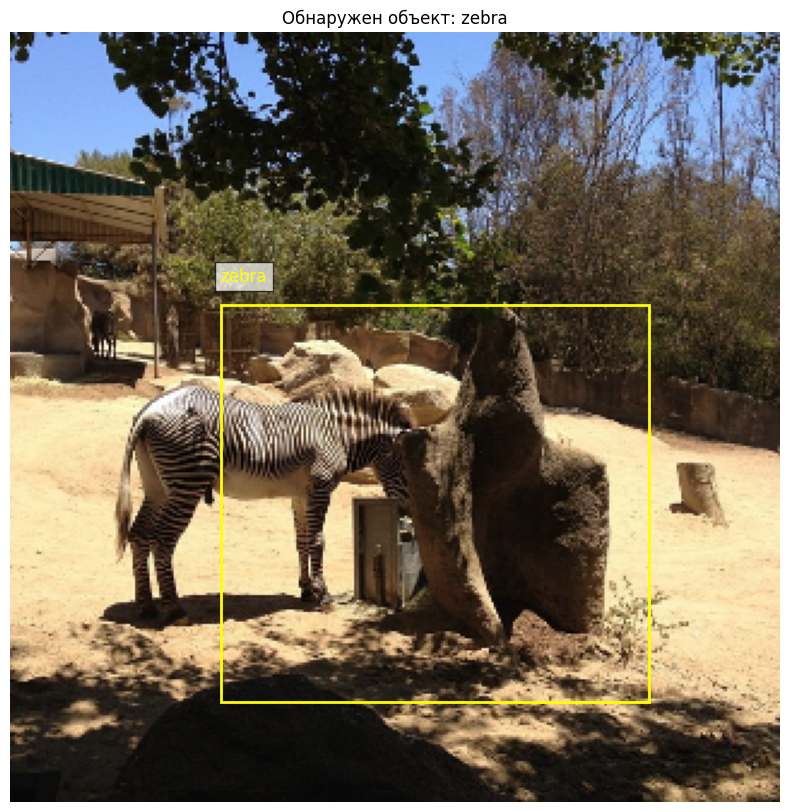

Истинный класс: zebra
Истинные координаты: x=0.336, y=0.600, w=0.387, h=0.294
Предсказанный класс: zebra
Предсказанные координаты: x=0.551, y=0.612, w=0.558, h=0.517
1/1 [==============================] - 0s 36ms/step


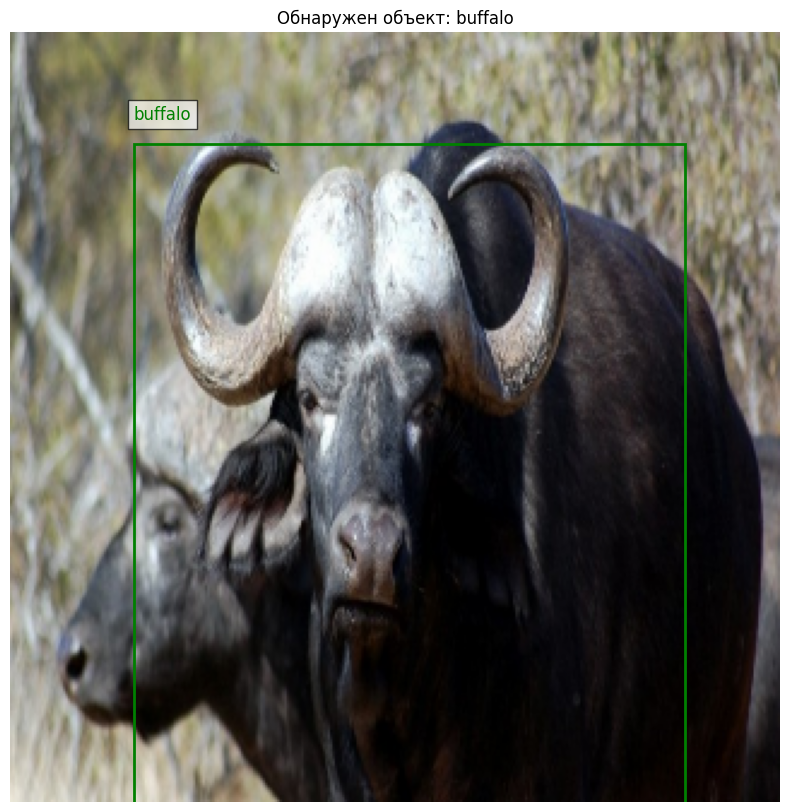

Истинный класс: buffalo
Истинные координаты: x=0.590, y=0.555, w=0.773, h=0.878
Предсказанный класс: buffalo
Предсказанные координаты: x=0.518, y=0.578, w=0.715, h=0.869
1/1 [==============================] - 0s 25ms/step


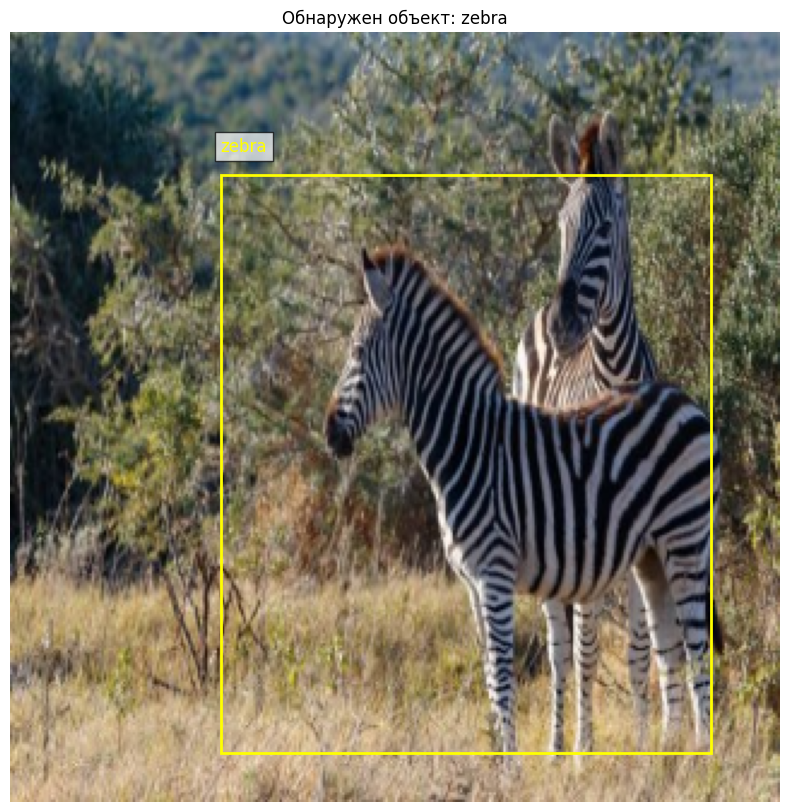

Истинный класс: zebra
Истинные координаты: x=0.666, y=0.614, w=0.527, h=0.684
Предсказанный класс: zebra
Предсказанные координаты: x=0.593, y=0.561, w=0.637, h=0.752
1/1 [==============================] - 0s 24ms/step


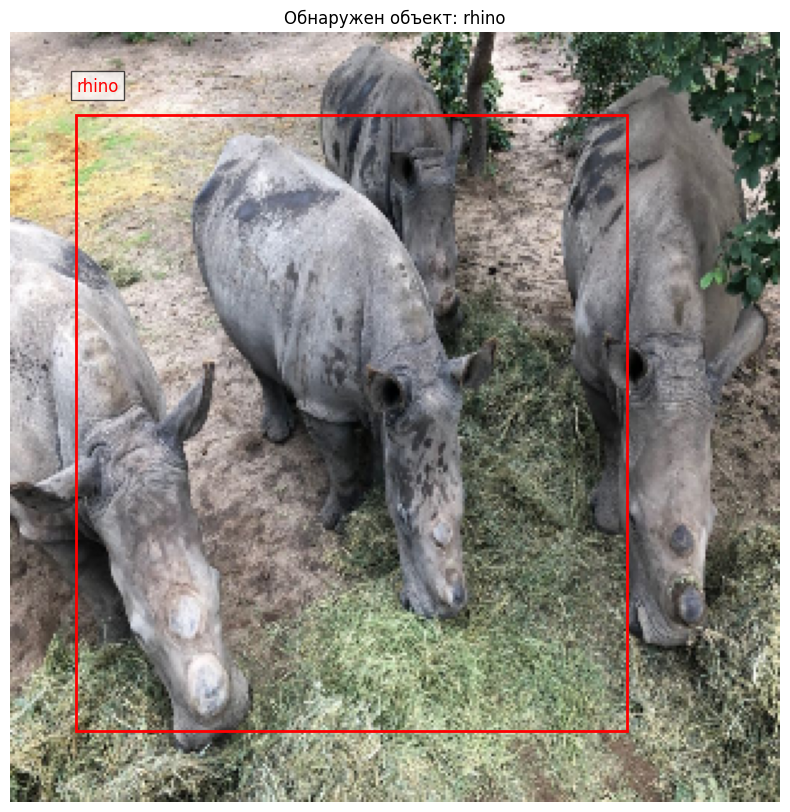

Истинный класс: rhino
Истинные координаты: x=0.157, y=0.583, w=0.312, h=0.694
Предсказанный класс: rhino
Предсказанные координаты: x=0.443, y=0.508, w=0.716, h=0.798


In [ ]:
display_sample_predictions(model, num_samples=4)